In [46]:
# For the white wine dataset (notorious, infamous)
# Using CTGAN instead in order to "fill in the gaps"
# another option: Copula Synthesizer 
# but for I will stick to CTGAN

# TomekLinks to clean out the overlapping through the dataset
# Autoencoders instead of TomekLinks, might be viable
# consider using ClusterCentroids for noise/overlap removal
# https://miro.medium.com/v2/resize:fit:700/1*1XlHmnc9hKn1oPz48lrn7Q.png

# Kmeans Clustering => let's try assigning each wine a 
# automated unsupervised AI cluster => use this information
# to determine the difference between qualities 5 and 6
# also experiment on other clustering methods than KMeans
# https://scikit-learn.org/1.5/_images/sphx_glr_plot_cluster_comparison_001.png

<h4>Here is to improve the white wine dataset further for the model to work efficiently</h4>

In [1]:
# import the modules needed
import pandas as pd
import seaborn as sns
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
import numpy as np
import random
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.metrics import confusion_matrix
import itertools
from imblearn.under_sampling import RandomUnderSampler
import seaborn as sns
from ctgan import CTGAN
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import ADASYN
from imblearn.under_sampling import EditedNearestNeighbours
# from adasyn import ADASYN
#from sdv.tabular import CTGAN
#from ctgan import CTGANSynthesizer

# pip install xgboost
from xgboost import XGBClassifier

In [2]:
# pd.set_option('display.float_format', '{:.1f}'.format)
# I load the dataset for reading on pandas
# and dropped all the duplicates
df = pd.read_csv("white_wine_cleaned.csv")

df = df.drop_duplicates()

In [3]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
6,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6


In [4]:
# Goal here is to achieve optimisation
# So its important lock the random seed
# this is to have same result
# without interference but for reproducibility
# random_seed = 789765555
random_seed = 437887

random.seed(random_seed)
np.random.seed(random_seed)

<h4>Starting with synthesizing with CTGAN</h4>

In [5]:
df.corr()['quality']

fixed acidity          -0.124636
volatile acidity       -0.190678
citric acid             0.007065
residual sugar         -0.117339
chlorides              -0.217739
free sulfur dioxide     0.010507
total sulfur dioxide   -0.183356
density                -0.337805
pH                      0.123829
sulphates               0.053200
alcohol                 0.462869
quality                 1.000000
Name: quality, dtype: float64

Class distribution before synthetization:
quality
6    1788
5    1175
7     689
4     153
8     131
3      20
9       5
Name: count, dtype: int64


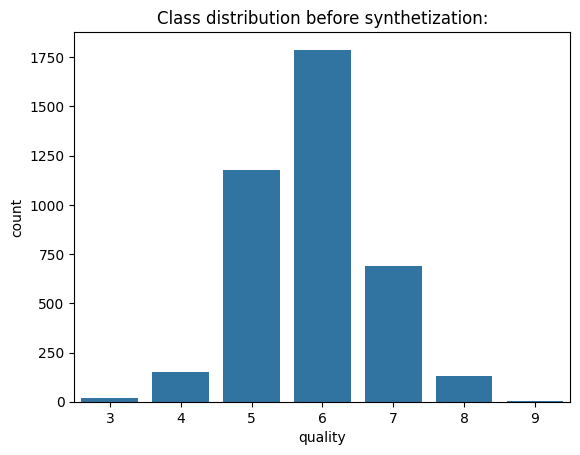

Gen. (-0.44) | Discrim. (-0.23): 100%|██████████| 100/100 [03:16<00:00,  1.96s/it]


Class distribution after synthetization:
quality
6    833
5    771
7    737
8    558
4    536
3    323
9    203
Name: count, dtype: int64


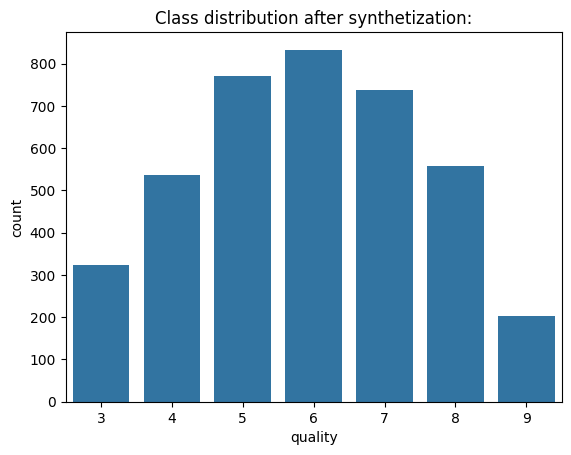

Synthetic data generation complete!


In [6]:
# I researched through Google and ChatGPT to modified 
# the CTGAN model 
# Display initial class distribution
print("Class distribution before synthetization:")
print(df['quality'].value_counts())

# Visualize initial class distribution
sns.countplot(x='quality', data=df)
plt.title('Class distribution before synthetization:')
plt.show()

# I define the target variable
target = "quality"

# This list the categorical columns
categorical_columns = ['quality']

# I initialize CTGAN with adjusted parameters
ctgan = CTGAN(
    epochs=100,  # Increase epochs
    batch_size=128,  # Adjust batch size
    discriminator_lr=2e-4,  # Discriminator learning rate
    generator_lr=2e-4,  # Generator learning rate
    verbose=True,
    pac=1  # Enable verbose output
)

# Then fit CTGAN model on the dataset
ctgan.fit(df, discrete_columns=categorical_columns)

# This generate synthetic data with the same size as the original dataset
synthetic_df = ctgan.sample(len(df))

# Display new class distribution
print("Class distribution after synthetization:")
print(synthetic_df['quality'].value_counts())

# Visualize new distribution
sns.countplot(x='quality', data=synthetic_df)
plt.title('Class distribution after synthetization:')
plt.show()

# Save the synthetic data to a separate dataframe
synthetic_df.to_csv('synthetic_white_wine_data.csv', index=False)

# Store the synthetic and original datasets
authentic_df = df.copy()
df = synthetic_df

print("Synthetic data generation complete!")

In [7]:
authentic_df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
6,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


In [8]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,6.075745,0.265543,0.279265,3.280358,0.036175,34.375058,142.007527,0.988895,3.554978,0.573725,10.650573,7
1,8.549514,0.314553,0.871651,6.262427,0.063889,43.308336,167.416978,1.000373,3.207806,0.327318,9.493012,5
2,6.682779,0.320496,0.350710,8.272834,0.054888,62.778295,181.032630,0.998498,3.134826,0.337011,9.384997,6
3,6.111486,0.250933,0.514634,0.283595,0.042372,1.007302,129.304740,0.990661,2.995887,0.345828,10.756075,6
4,5.346094,0.390838,0.393739,0.863562,0.038336,22.326113,139.132089,0.989973,3.389120,0.629412,11.904975,7
...,...,...,...,...,...,...,...,...,...,...,...,...
3956,5.116250,0.432057,0.284633,1.343145,0.054287,52.756714,186.277654,0.994380,3.319680,0.470596,10.766729,6
3957,5.607825,0.178513,0.295413,1.099967,0.046389,31.468903,131.885500,0.992814,3.184029,0.506139,10.255963,7
3958,6.368821,0.337945,0.330894,7.013553,0.129107,43.161394,120.414819,0.994737,3.218022,0.596628,11.491208,5
3959,7.079087,0.274953,0.306595,7.871621,0.055830,14.362537,87.605044,0.994563,3.129810,0.321642,10.688566,4


<b>NB:<b> 
<h4>Before sythentic data, The distribution is highly showed imbalanced. Classes with lower values (like 3 and 9) have very few instances (20 and 5 samples respectively), while class 6 has the most instances with 1,788 samples. I this imbalance could be bias in the model towards predicting the majority class (class 6) and lead to poor generalization for minority classes.
And after the synthetic data, the distribution shows that only the class 7 has increased in sample size, now almost matching the sample size of the majority class 6. However, other minority classes (such as 3 and 9) remain unchanged, which I think suggested a targeted or partial oversampling approach where only certain classes were synthetically generated. This approach can reduce model bias without excessively generating synthetic data, allowing for better representation of class 7 while maintaining the original distribution of the other classes.</h4>

In [9]:
# max threshold for majority classes
threshold = 53

# temporary list to containe sample rows
sampled_data = []

for quality, group in authentic_df.groupby('quality'):
    # if a minority group, just add all the data
    if len(group) <= threshold:
        sampled_data.append(group)
    else:
        sampled_data.append(group.sample(threshold))


# combine all data in the sample list
authentic_sample = pd.concat(sampled_data)

# drop the selected data from the original data
authentic_df = authentic_df.drop(authentic_sample.index)

# reset indexes
authentic_sample = authentic_sample.reset_index(drop=True)
authentic_df = authentic_df.reset_index(drop=True)

df = pd.concat([df, authentic_df])
df = df.reset_index(drop=True)

In [10]:
df.corr()['quality']

fixed acidity          -0.075484
volatile acidity       -0.168495
citric acid             0.044019
residual sugar         -0.081627
chlorides              -0.243064
free sulfur dioxide     0.004962
total sulfur dioxide   -0.215400
density                -0.384975
pH                      0.078516
sulphates               0.079985
alcohol                 0.425932
quality                 1.000000
Name: quality, dtype: float64

In [11]:
tomek = TomekLinks()

# Display new class distribution
print("Class distribution before overlap removal:")
print(df['quality'].value_counts())

# X/y -split
X = df.drop("quality", axis=1)
y = df['quality']

# create new resampled versions of X and y
X, y = tomek.fit_resample(X, y)

# re-create a new DataFrame
df = pd.DataFrame(X, columns=X.columns)
df['quality'] = y

# Display new class distribution
print("Class distribution AFTER overlap removal:")
print(df['quality'].value_counts())

Class distribution before overlap removal:
quality
6    2568
5    1893
7    1373
4     636
8     636
3     323
9     203
Name: count, dtype: int64
Class distribution AFTER overlap removal:
quality
6    1728
5    1256
7     837
8     393
4     365
9     203
3     191
Name: count, dtype: int64


In [12]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,6.075745,0.265543,0.279265,3.280358,0.036175,34.375058,142.007527,0.988895,3.554978,0.573725,10.650573,7
1,6.111486,0.250933,0.514634,0.283595,0.042372,1.007302,129.304740,0.990661,2.995887,0.345828,10.756075,6
2,5.346094,0.390838,0.393739,0.863562,0.038336,22.326113,139.132089,0.989973,3.389120,0.629412,11.904975,7
3,6.413410,0.303321,0.389279,0.908394,0.036316,59.351209,195.533512,0.990606,2.966026,0.539560,10.920547,7
4,7.986901,0.252398,0.494460,8.679911,0.047855,19.801319,257.410163,0.996064,3.051207,0.490029,12.192836,4
...,...,...,...,...,...,...,...,...,...,...,...,...
4968,4.900000,0.235000,0.270000,11.750000,0.030000,34.000000,118.000000,0.995400,3.070000,0.500000,9.400000,6
4969,6.100000,0.340000,0.290000,2.200000,0.036000,25.000000,100.000000,0.989380,3.060000,0.440000,11.800000,6
4970,5.700000,0.210000,0.320000,0.900000,0.038000,38.000000,121.000000,0.990740,3.240000,0.460000,10.600000,6
4971,6.600000,0.320000,0.360000,8.000000,0.047000,57.000000,168.000000,0.994900,3.150000,0.460000,9.600000,5


In [13]:

scaler = StandardScaler()
X_scaled = scaler.fit_transform(df.drop('quality', axis=1))

# filter only qualities 5 and 6 from the dataset
# BY DEFAULT APPLYING CLUSTERING ONLY TO A SUBSET OF DATA CAN BE RISKY
# ALWAYS DOUBLE-CHECK AND CROSS-VALIDATE
# AND CHECK THAT THE DISTRIBUTION IS HELPFUL AND MAKES SENSE
df_overlap = df[df['quality'].isin([5,6])]

X_overlap_scaled = scaler.transform(df_overlap.drop("quality", axis=1))

# use KMeans to cluster these wines into clusters
# => try to find a separation where the algorithm recognizes the wines
# without knowing the actual quality level
clusterer = KMeans(n_clusters=4, init="k-means++", tol=1e-10)

labels = clusterer.fit_predict(X_overlap_scaled)

df_overlap['cluster'] = labels

# this clustering information is added to the original dataset as a new helper variable

# wines with quality less than 5 use the same cluster as quality 5
# wines with qualite more than 6 use the same cluster as quality 6
    
X_all_scaled = scaler.transform(df.drop("quality", axis=1))
# add the cluster information back to the DataFrame
#df['cluster'] = df.apply(map_cluster_value, axis=1)
labels = clusterer.predict(X_all_scaled) 
df['cluster'] = labels

X_authentic_scaled = scaler.transform(authentic_sample.drop("quality", axis=1))
labels = clusterer.predict(X_authentic_scaled)
authentic_sample['cluster'] = labels

C:\Users\User\AppData\Local\Temp\ipykernel_12496\2298281380.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_overlap['cluster'] = labels


In [14]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,cluster
0,6.075745,0.265543,0.279265,3.280358,0.036175,34.375058,142.007527,0.988895,3.554978,0.573725,10.650573,7,1
1,6.111486,0.250933,0.514634,0.283595,0.042372,1.007302,129.304740,0.990661,2.995887,0.345828,10.756075,6,3
2,5.346094,0.390838,0.393739,0.863562,0.038336,22.326113,139.132089,0.989973,3.389120,0.629412,11.904975,7,1
3,6.413410,0.303321,0.389279,0.908394,0.036316,59.351209,195.533512,0.990606,2.966026,0.539560,10.920547,7,3
4,7.986901,0.252398,0.494460,8.679911,0.047855,19.801319,257.410163,0.996064,3.051207,0.490029,12.192836,4,2


In [15]:
cluster_counts = df.groupby(['quality', 'cluster']).size().unstack(fill_value=0)
print(cluster_counts)

cluster   0    1    2    3
quality                   
3         3   62   82   44
4         7  177   73  108
5        47  337  591  281
6        45  659  486  538
7         4  488   79  266
8         2  207   42  142
9         1  138    2   62


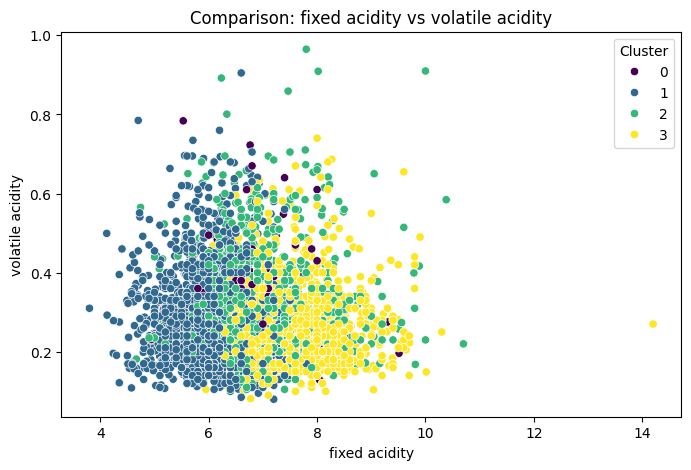

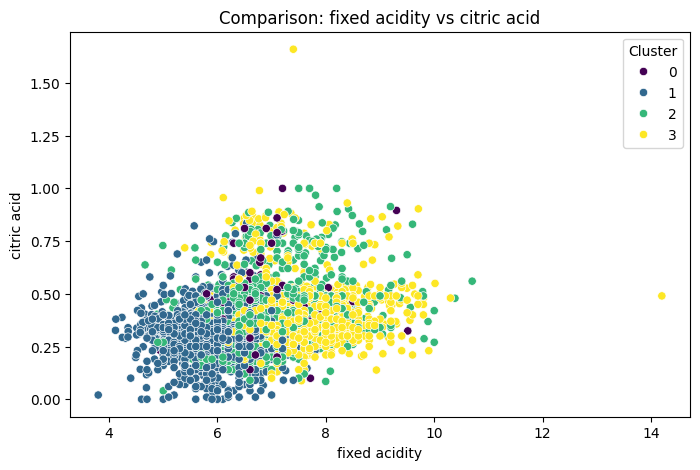

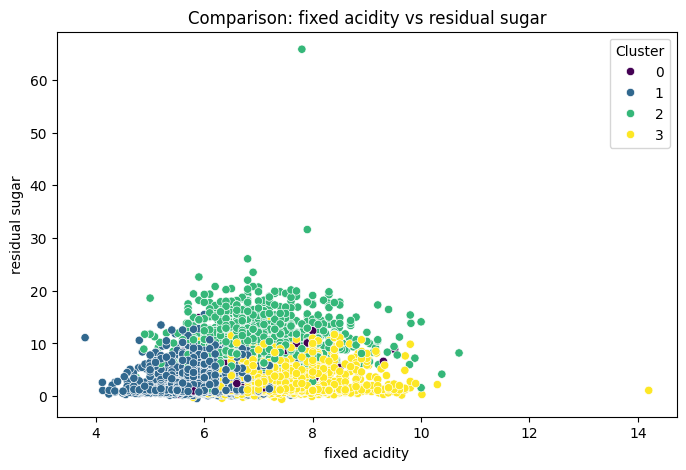

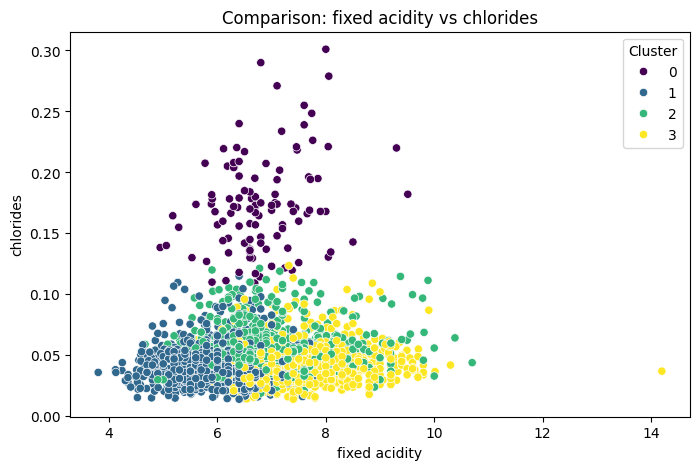

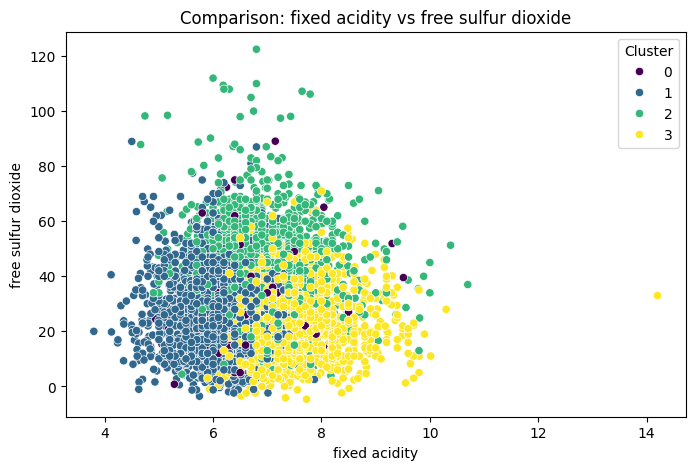

...

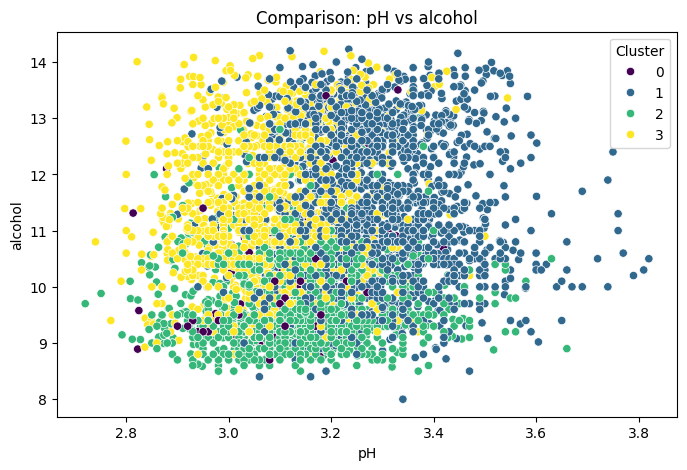

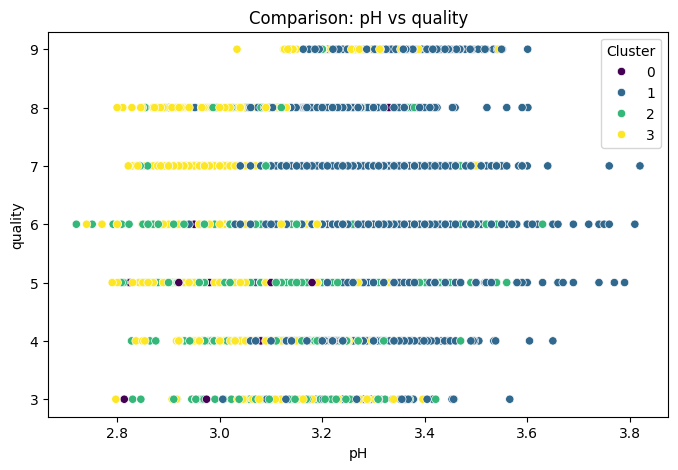

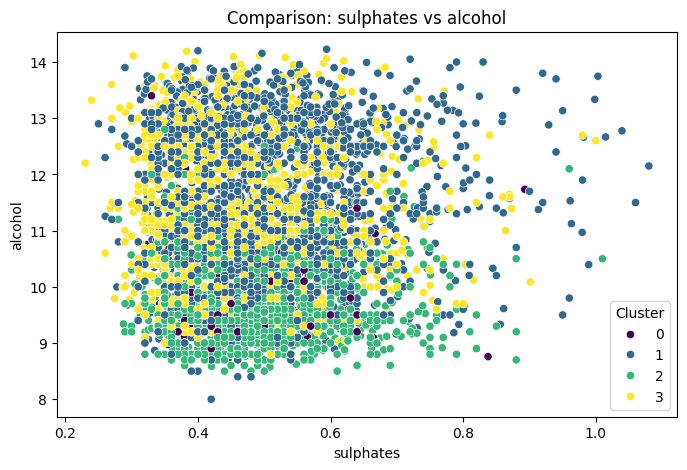

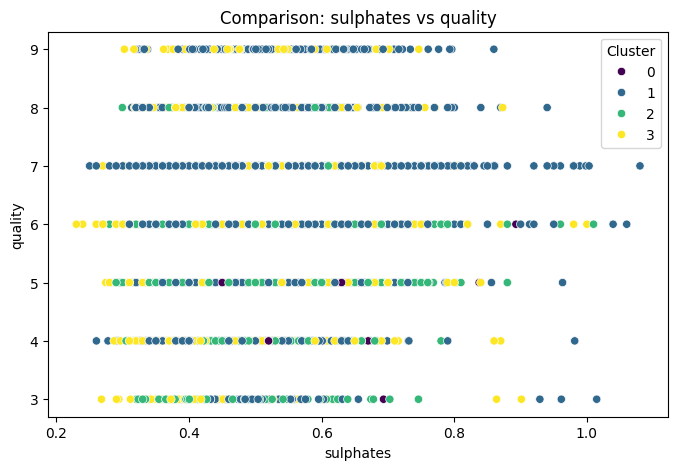

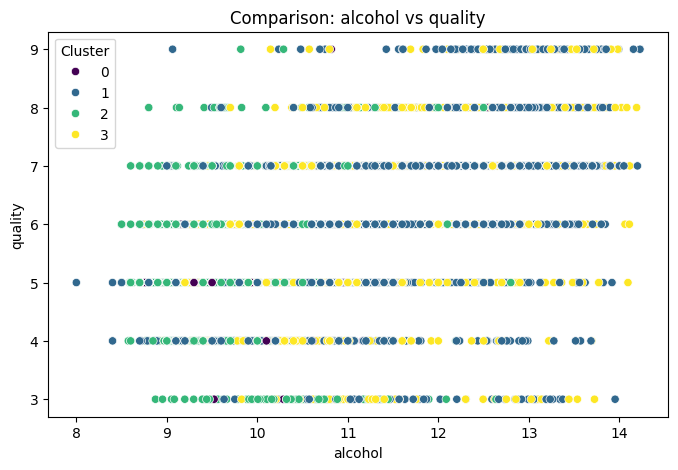

In [16]:
# get only numeric only
numeric_cols = df.select_dtypes(include="number").columns.drop("cluster")

# create all possible combinations of variables
column_pairs = list(itertools.combinations(numeric_cols, 2))

# just a helper variable so we can quickly turn off the visualizations
# since they take a bit time
skip_visuals = False

for x_col, y_col in column_pairs:
    if skip_visuals:
        break

    plt.figure(figsize=(8, 5))
    sns.scatterplot(data=df, x=x_col, y=y_col, hue="cluster", palette="viridis")
    plt.title(f"Comparison: {x_col} vs {y_col}")
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.legend(title="Cluster")
    plt.show()

In [17]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'cluster'],
      dtype='object')

In [18]:
# X/y -split
X = df[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'cluster']]

y = df['quality']

In [19]:
authentic_sample

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,cluster
0,8.5,0.26,0.21,16.2,0.074,41.0,197.0,0.99800,3.02,0.50,9.8,3,2
1,5.8,0.24,0.44,3.5,0.029,5.0,109.0,0.99130,3.53,0.43,11.7,3,1
2,9.1,0.59,0.38,1.6,0.066,34.0,182.0,0.99680,3.23,0.38,8.5,3,2
3,7.1,0.32,0.32,11.0,0.038,16.0,66.0,0.99370,3.24,0.40,11.5,3,3
4,6.9,0.39,0.40,4.6,0.022,5.0,19.0,0.99150,3.31,0.37,12.6,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
285,9.1,0.27,0.45,10.6,0.035,28.0,124.0,0.99700,3.20,0.46,10.4,9,3
286,6.6,0.36,0.29,1.6,0.021,24.0,85.0,0.98965,3.41,0.61,12.4,9,1
287,7.4,0.24,0.36,2.0,0.031,27.0,139.0,0.99055,3.28,0.48,12.5,9,3
288,6.9,0.36,0.34,4.2,0.018,57.0,119.0,0.98980,3.28,0.36,12.7,9,1


In [20]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,cluster
0,6.075745,0.265543,0.279265,3.280358,0.036175,34.375058,142.007527,0.988895,3.554978,0.573725,10.650573,7,1
1,6.111486,0.250933,0.514634,0.283595,0.042372,1.007302,129.304740,0.990661,2.995887,0.345828,10.756075,6,3
2,5.346094,0.390838,0.393739,0.863562,0.038336,22.326113,139.132089,0.989973,3.389120,0.629412,11.904975,7,1
3,6.413410,0.303321,0.389279,0.908394,0.036316,59.351209,195.533512,0.990606,2.966026,0.539560,10.920547,7,3
4,7.986901,0.252398,0.494460,8.679911,0.047855,19.801319,257.410163,0.996064,3.051207,0.490029,12.192836,4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4968,4.900000,0.235000,0.270000,11.750000,0.030000,34.000000,118.000000,0.995400,3.070000,0.500000,9.400000,6,2
4969,6.100000,0.340000,0.290000,2.200000,0.036000,25.000000,100.000000,0.989380,3.060000,0.440000,11.800000,6,1
4970,5.700000,0.210000,0.320000,0.900000,0.038000,38.000000,121.000000,0.990740,3.240000,0.460000,10.600000,6,1
4971,6.600000,0.320000,0.360000,8.000000,0.047000,57.000000,168.000000,0.994900,3.150000,0.460000,9.600000,5,2


In [21]:

categories = list(np.unique(df['quality']))

# let's encode our target from the original 3,4,5,6,7,8 to 0,1,2,3,4,5
le = LabelEncoder()
y = le.fit_transform(y)

# if bad result, consider shuffling the dataset just in case

# stratify can be used to ensure that train/test -split aims to have same distributions
# for both train and test datasets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y)

X_train = X
y_train = y

X_test = authentic_sample[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'cluster']]


y_test = authentic_sample['quality']
y_test = le.transform(y_test)


In [22]:
model = XGBClassifier(
    objective="multi:softmax",
    num_class=6,
    n_estimators = 300,
    max_depth=6,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8
)

model.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.8,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=300,
              n_jobs=0, num_class=6, num_parallel_tree=1,
              objective='multi:softmax', predictor='auto', random_state=0, ...)

In [23]:
test_predictions = model.predict(X_test)

<Axes: >

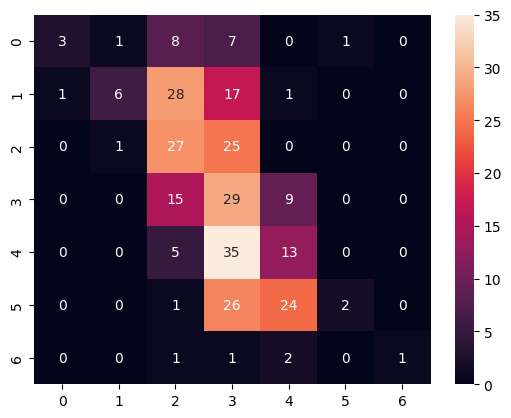

In [24]:
sns.heatmap(confusion_matrix(y_test, test_predictions), annot=True, fmt='g')

In [25]:
print(classification_report(y_test, test_predictions))

acc = accuracy_score(y_test, test_predictions)
print("\nModel overall accuracy: {:.2f}%".format(acc * 100))

              precision    recall  f1-score   support

           0       0.75      0.15      0.25        20
           1       0.75      0.11      0.20        53
           2       0.32      0.51      0.39        53
           3       0.21      0.55      0.30        53
           4       0.27      0.25      0.25        53
           5       0.67      0.04      0.07        53
           6       1.00      0.20      0.33         5

    accuracy                           0.28       290
   macro avg       0.57      0.26      0.26       290
weighted avg       0.47      0.28      0.25       290


Model overall accuracy: 27.93%


<h4>I actaually analyse the white wine with CTGAN model tool which made me conclude that CTGAN method tool actaually will 
not yield the desired result as it wouldn't work efficiently with the model for the regression. Going by the accuracy which indicate a highly poor model.</h4>